# Analysis of continuosity

In [376]:
import scanpy as sc
import numpy as np
import scanpy.external as sce
import pandas as pd
import scvelo as scv
import seaborn as sns
import matplotlib.pyplot as plt
import importlib
import sys
import symphonypy as sp
import scFates as scf

import sys
sys.path.append("/home/sergey/tools/scLiTr/")
import sclitr as sl

# Figures aesthetics
sc.set_figure_params(dpi=150)
sns.set_style("ticks")

In [225]:
g2m_genes = list(pd.read_csv("/home/sergey/data/additional/cell_cycle_genes/G2M_phase.txt", names=["gene"]).gene)
g2m_genes = [gene[0].upper() + gene[1:].lower() for gene in g2m_genes]

s_genes = list(pd.read_csv("/home/sergey/data/additional/cell_cycle_genes/S_phase.txt", names=["gene"]).gene)
s_genes = [gene[0].upper() + gene[1:].lower() for gene in s_genes]

In [528]:
sc.settings.figdir = "contin/"

In [ ]:
adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_E13_clonal_clusters.h5ad")
adata = sl.pp.prepare_multiple_injections(
    adata,
    injection_cols=["E7.5:clones", "E8.5:clones"],
)

In [62]:
adata_mes = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/trunk_mes_E13_clonal_clusters.h5ad")

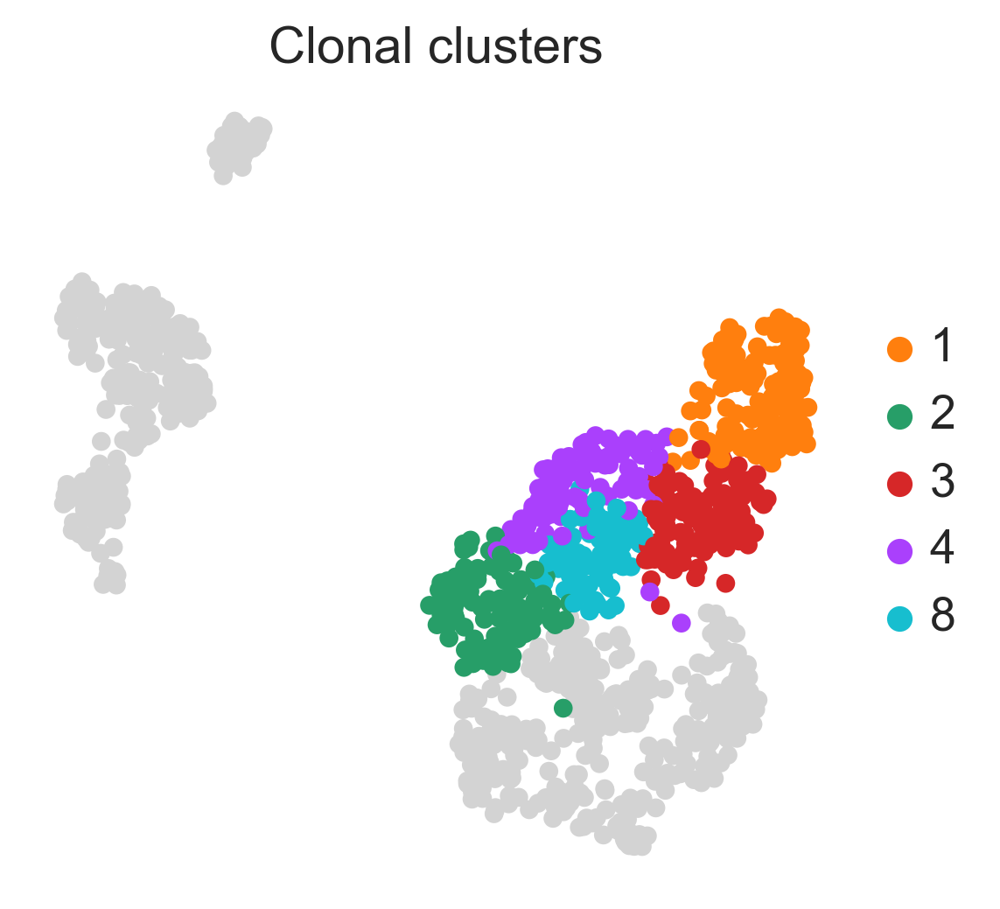

In [227]:
clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")

selected_clusters = ["1", "2", "3", "4", "8"]

sc.pl.umap(clones, color="leiden_1", title="Clonal clusters", groups=selected_clusters,
           frameon=False, na_in_legend=False, save="contin_clonal_UMAP.pdf")

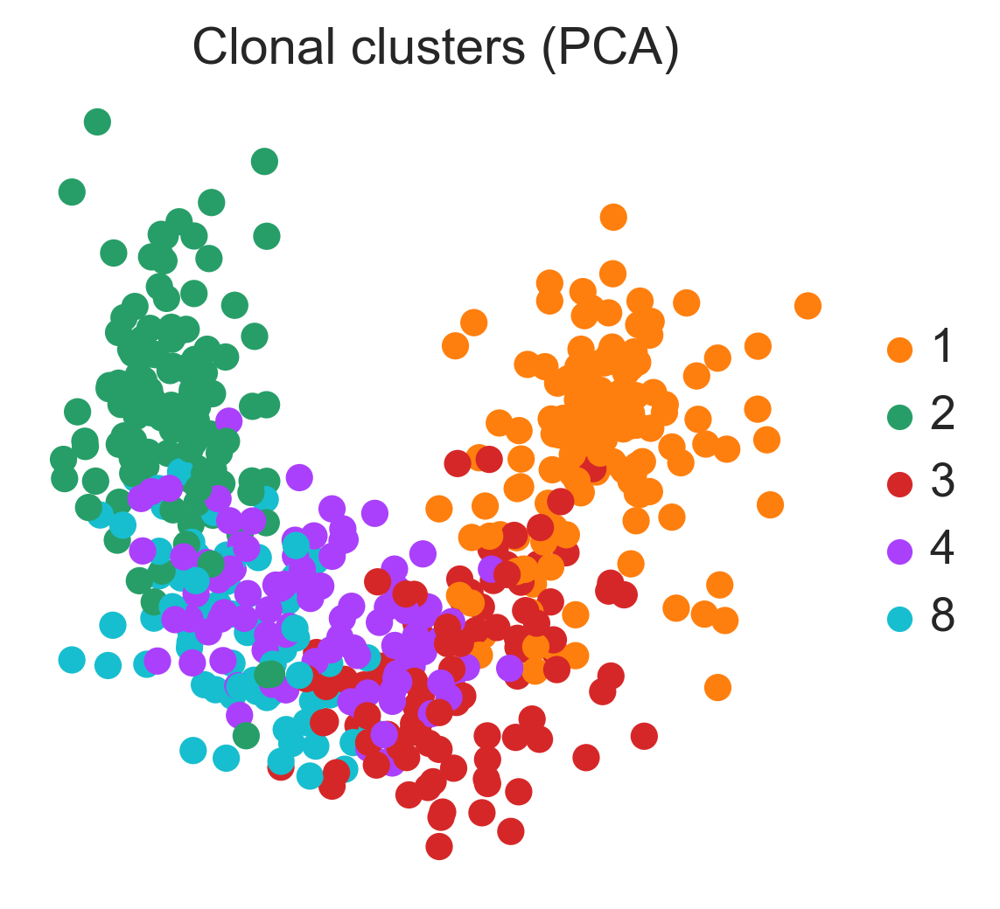

In [228]:
clones = clones[clones.obs.leiden_1.isin(selected_clusters)].copy()

clones.obsm["X_pca"] = sc.pp.pca(clones.obsm["word2vec"], n_comps=3)
sc.pl.pca(clones, color="leiden_1", title="Clonal clusters (PCA)", frameon=False,
          save="contin_PCA.pdf")

inferring a principal curve --> parameters used 
    15 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


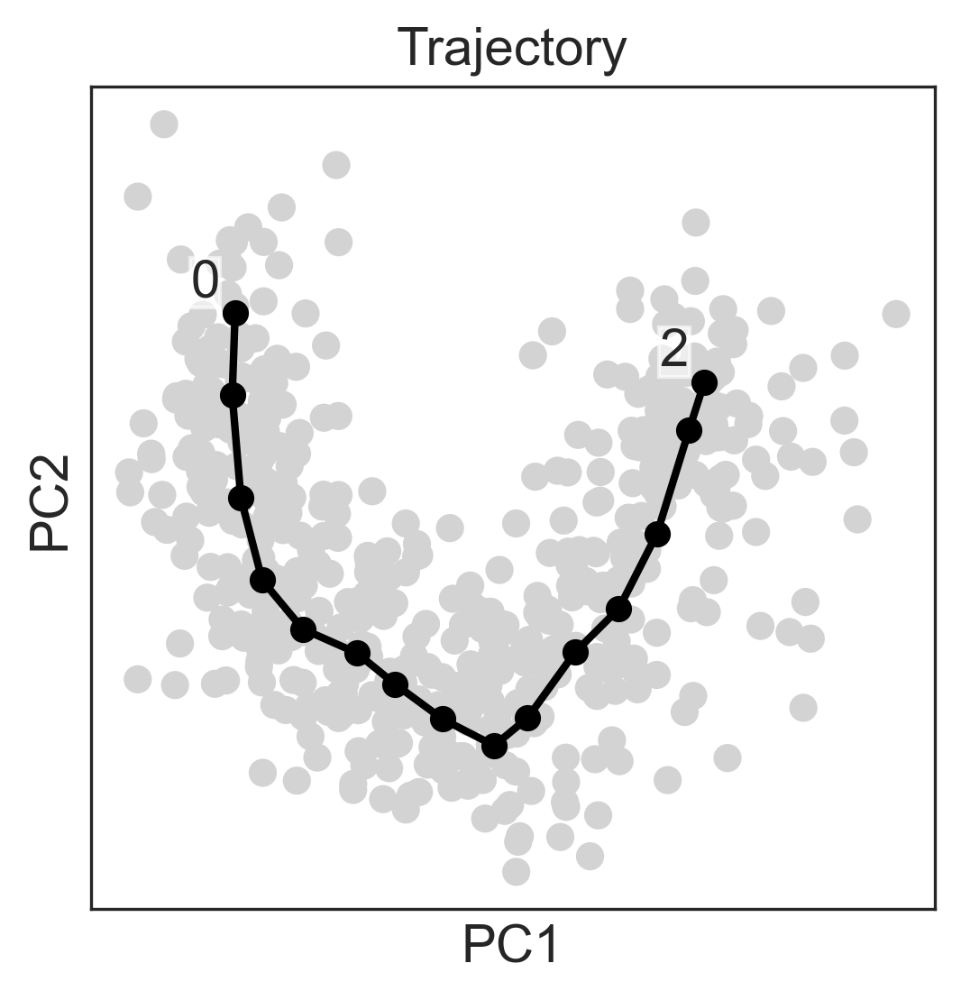

In [229]:
scf.tl.curve(clones, Nodes=15, use_rep="X_pca", ndims_rep=2)
scf.pl.graph(clones, basis="pca", title="Trajectory", save="contin_trajectory.pdf")

In [230]:
scf.tl.root(clones, 0)
scf.tl.pseudotime(clones, n_jobs=20, n_map=100, seed=42)

node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    mappings:   0%|          | 0/100 [00:00<?, ?it/s]

Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.g

    mappings: 100%|██████████| 100/100 [00:28<00:00,  3.45it/s]
    finished (0:00:29) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


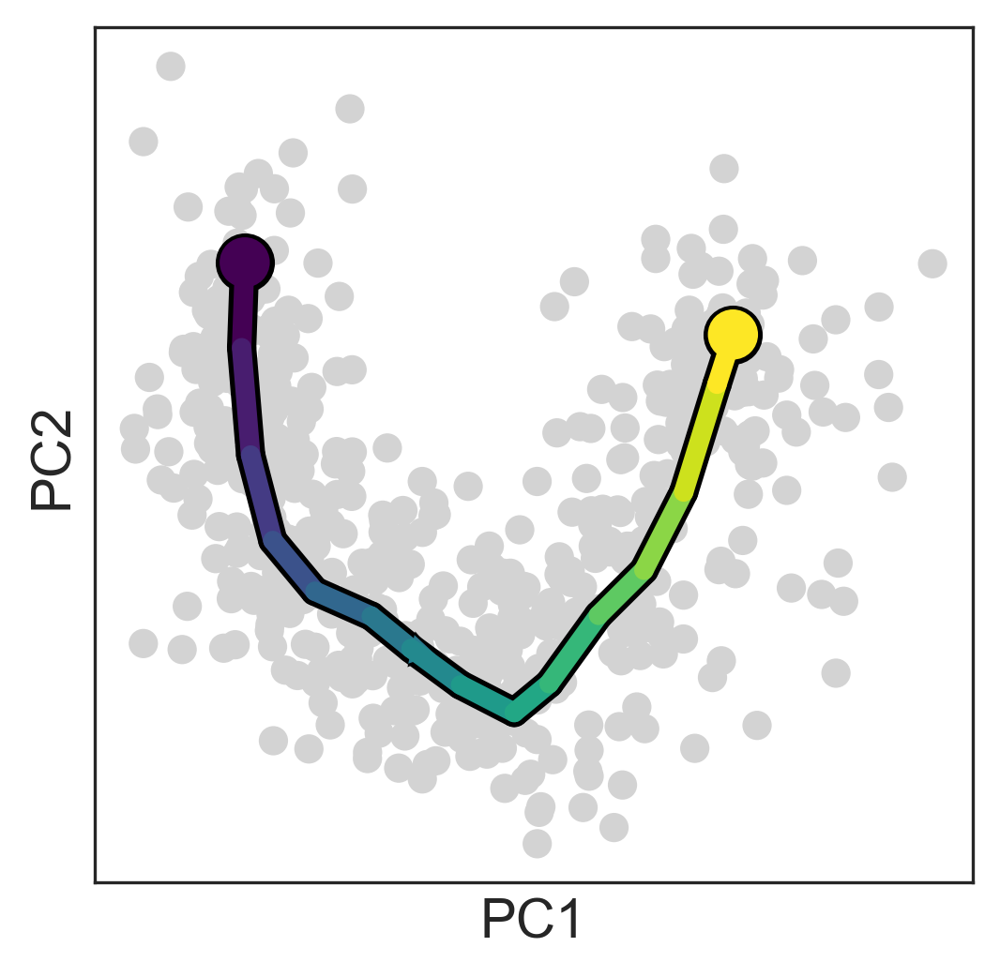

In [231]:
scf.pl.trajectory(clones, basis="pca", arrows=True, arrow_offset=3, save="contin_trajectory_pseudotime.pdf")

In [361]:
clones.X = clones.layers["frequencies"].copy()
selected_cts = [
    "Chondroblasts", "Meningeal fibroblasts",
    "Osteoblasts", "IVD", "Dermal mesenchyme",
]

clones_fit = scf.tl.fit(clones, features=selected_cts, n_jobs=20, copy=True)

fit features associated with the trajectory
    single mapping :   0%|          | 0/5 [00:00<?, ?it/s]

Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.


    single mapping :  20%|██        | 1/5 [00:17<01:08, 17.08s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  40%|████      | 2/5 [00:18<00:27,  9.09s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  80%|████████  | 4/5 [00:18<00:04,  4.67s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping : 100%|██████████| 5/5 [00:19<00:00,  3.83s/it]
    finished (adata subsetted to keep only fitted features!) (0:00:19) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


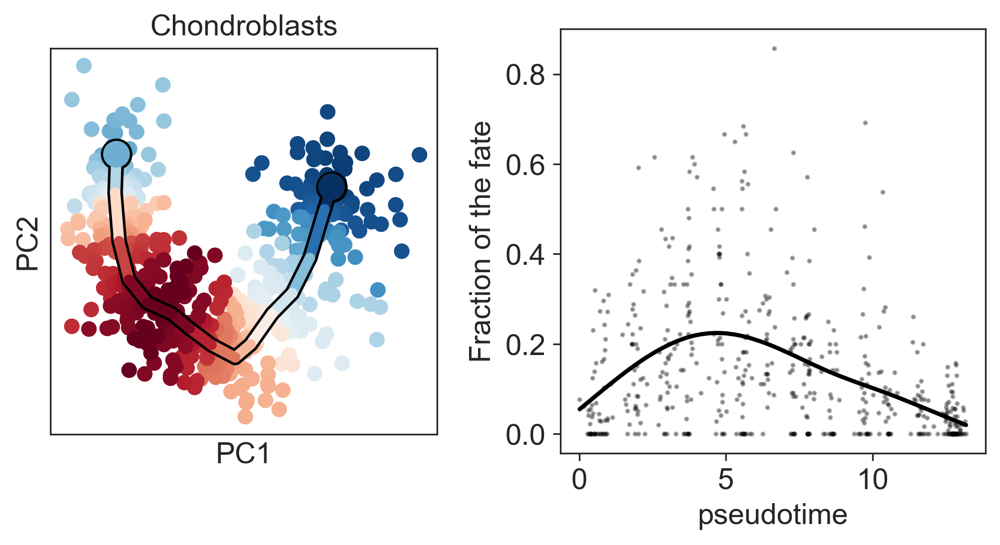

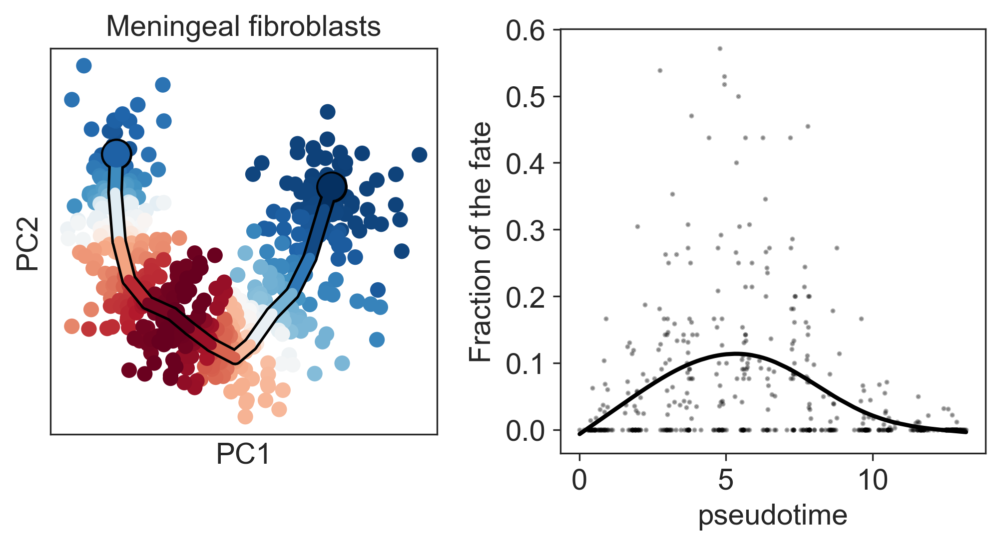

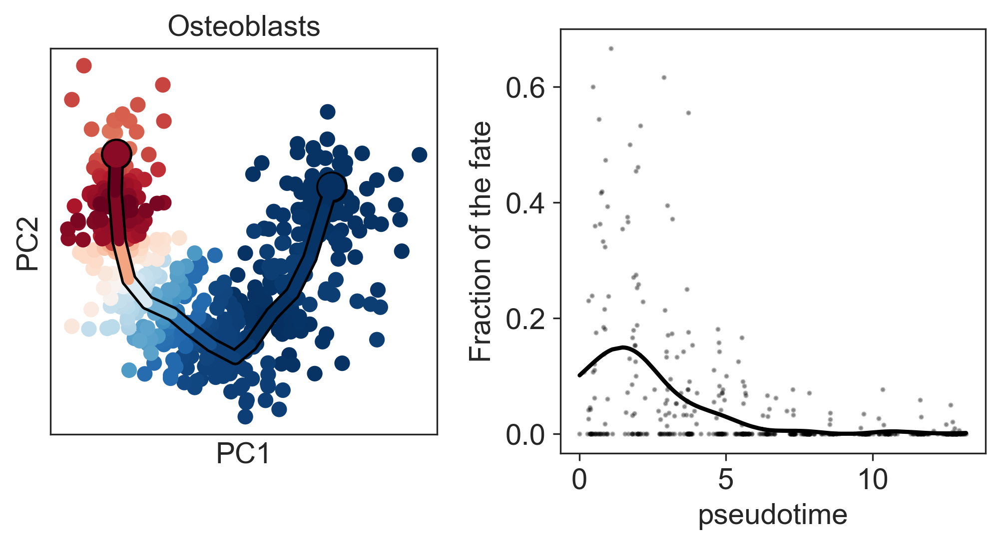

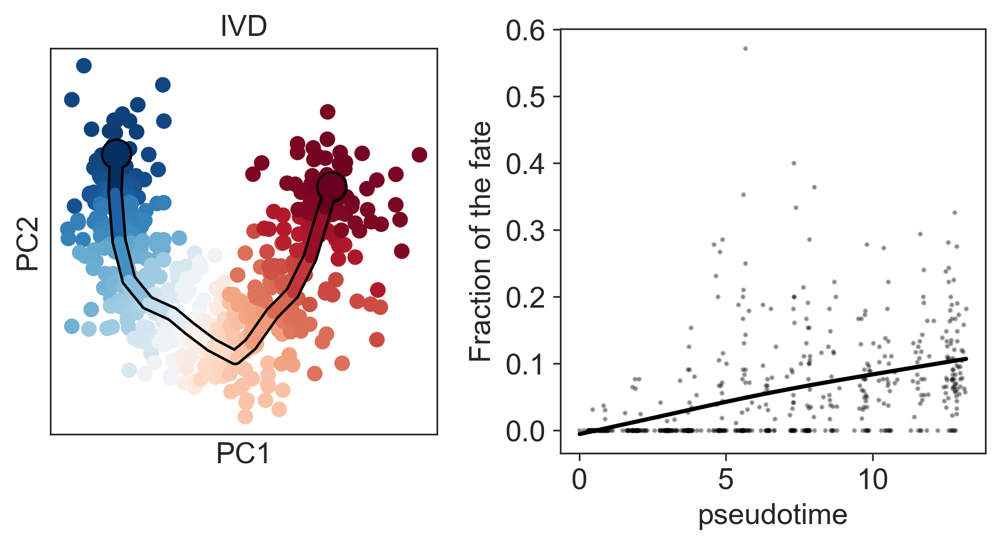

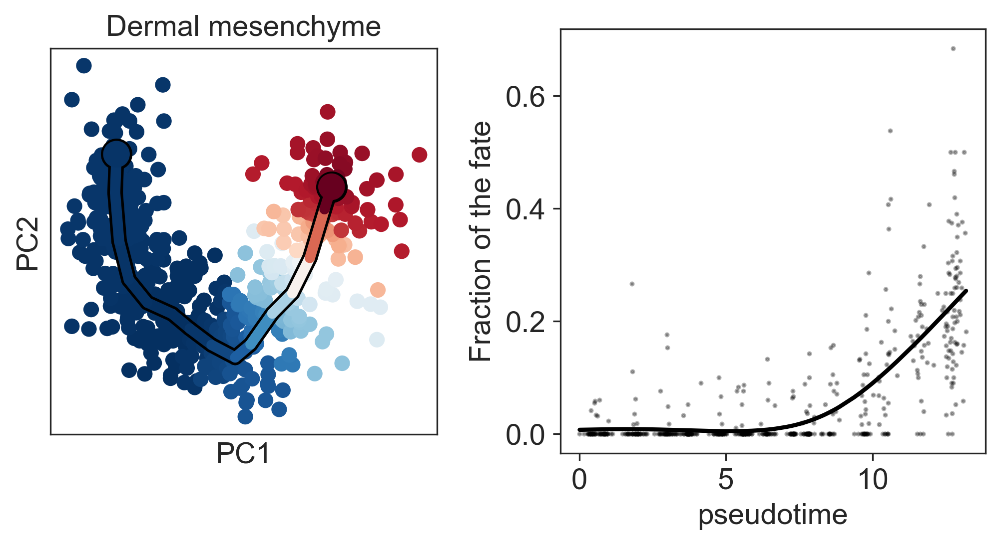

In [362]:
for ct in selected_cts:
    scf.pl.single_trend(clones_fit, ct, basis="pca", color_exp="black",
                        ylab="Fraction of the fate", save=f"contin_{ct}_prop.pdf")

In [538]:
sc.tl.rank_genes_groups(clones, groupby="leiden_1", method="wilcoxon")

selected_cts = []
for cluster in selected_clusters:
    selected_cts += list(sc.get.rank_genes_groups_df(clones, group=cluster).names[:5])
selected_cts = list(set(selected_cts))

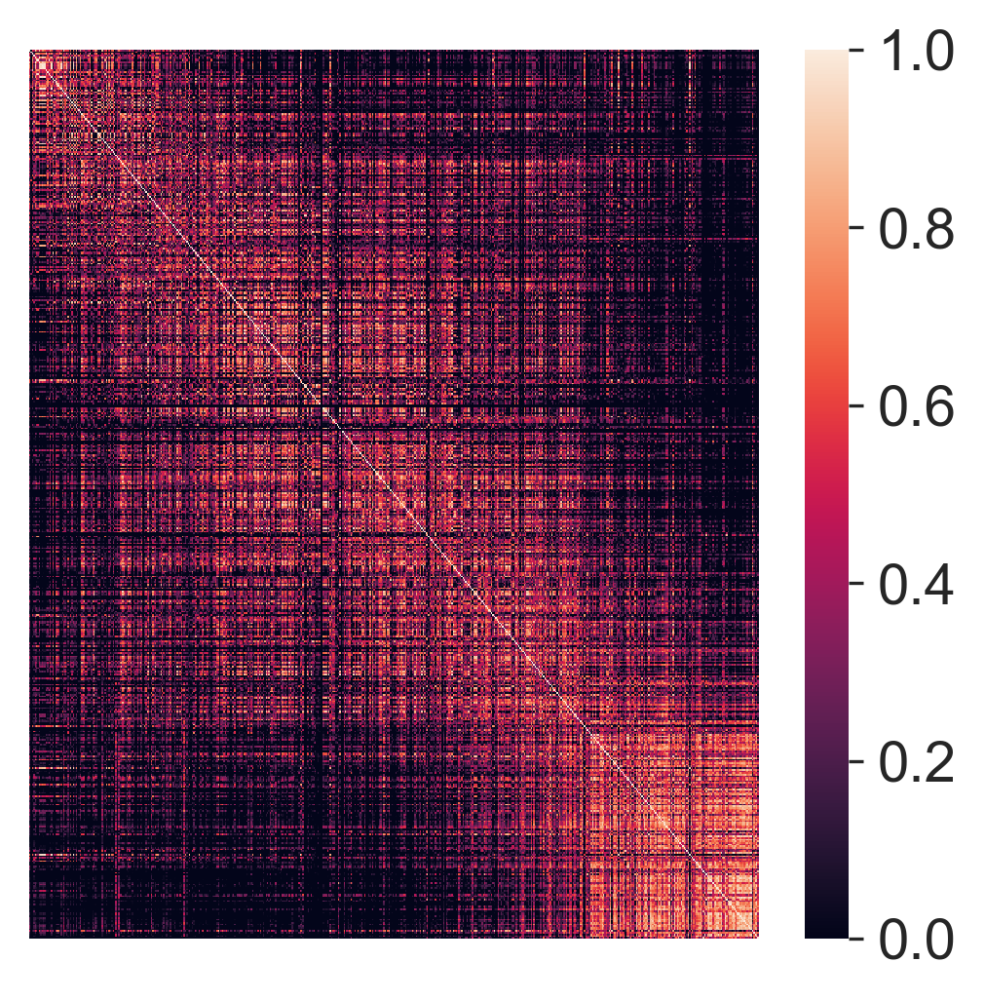

In [541]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.heatmap(
    pd.DataFrame(clones[clones.obs.t.sort_values().index, selected_cts].layers["frequencies"]).T.corr().fillna(0),
    vmin=0,
    ax=ax,
)
ax.set_xticks([])
ax.set_yticks([])

plt.savefig("contin/contin_correlations.png", bbox_inches="tight")

In [503]:
del clones.uns["epg"], clones_fit.uns["epg"]

clones.write_h5ad("contin/contin_clones.h5ad")
clones_fit.write_h5ad("contin/contin_clones_fit.h5ad")

In [234]:
clones_expr = clones.copy()
clones_expr.obs.index = [i.replace(":i", ":clones_i") for i in clones_expr.obs.index]
clones_expr = sl.tl.summarize_expression(adata, clones_expr)

genes = np.array([
    "Hoxc13", "Hoxc12", "Hoxc11",
    "Hoxd11", "Hoxc10", "Hoxd9",
    "Hoxc8", "Hoxa7", "Hoxc6", "Hoxb5",
    "Hoxb4"
])

anterio_posterior_signature = dict(enumerate(genes[::-1]))
anterio_posterior_signature = dict(zip(anterio_posterior_signature.values(), [i + 1 for i in anterio_posterior_signature.keys()]))

clones_expr.obs["Hox_position"] = (
    clones_expr[:, list(anterio_posterior_signature.keys())].X *
    np.array(list(anterio_posterior_signature.values())) / 
    clones_expr[:, list(anterio_posterior_signature.keys())].X.sum(axis=1).T.A
)[0]

clones_expr.obs["Hox_position"] = (
    clones_expr.obs["Hox_position"] - clones_expr.obs["Hox_position"].min()
) / (clones_expr.obs["Hox_position"].max() - clones_expr.obs["Hox_position"].min())

clones_expr.obs["Hox_position"] = [i if str(i) != "nan" else 0.5 for i in clones_expr.obs["Hox_position"]]

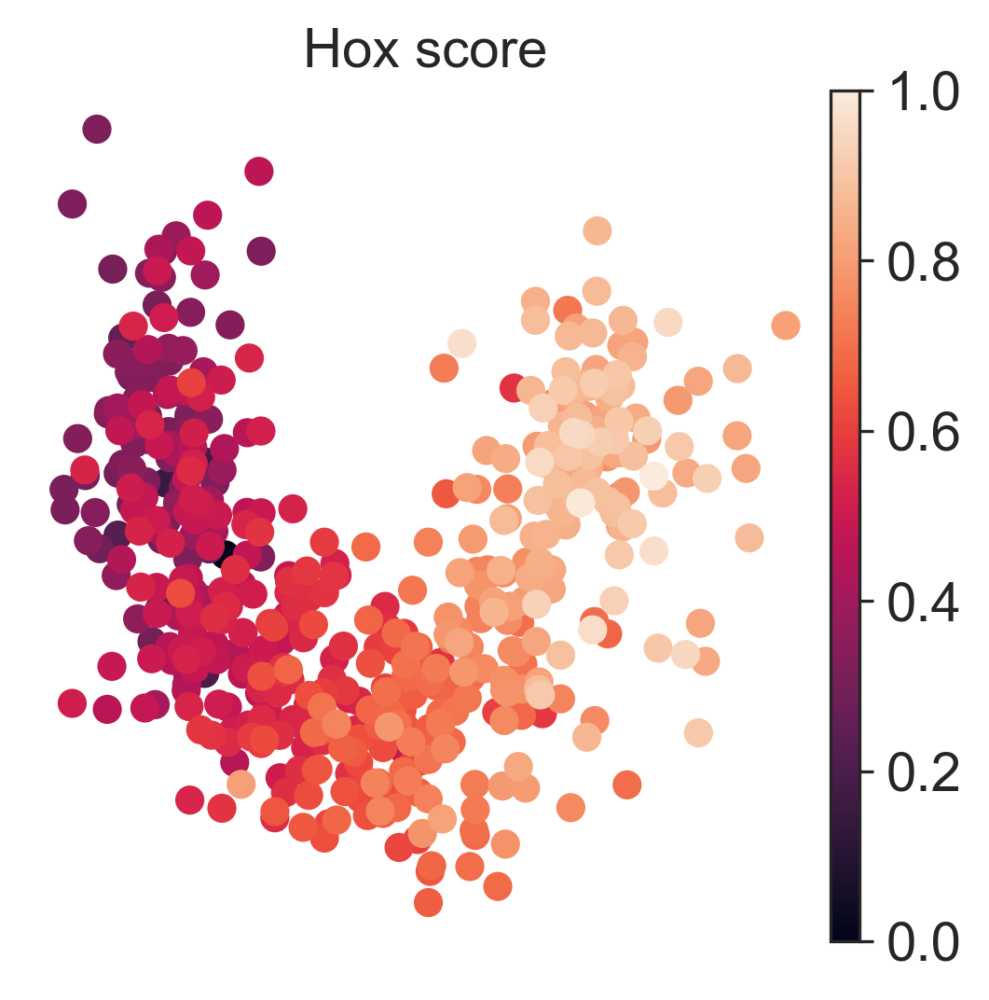

In [235]:
sc.pl.pca(clones_expr, color="Hox_position", frameon=False, title="Hox score")

In [177]:
clones_prolif = sc.AnnData(
    clones_expr.obs[["Hox_position", "S_score", "G2M_score"]],
    uns=clones_expr.uns,
    obsm=clones_expr.obsm,
    obs=clones_expr.obs,
)
scf.tl.fit(clones_prolif, features=clones_prolif.var_names, n_jobs=20)

fit features associated with the trajectory
    single mapping :   0%|          | 0/3 [00:00<?, ?it/s]

Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.


    single mapping :  33%|███▎      | 1/3 [00:14<00:29, 14.54s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  67%|██████▋   | 2/3 [00:14<00:07,  7.39s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping : 100%|██████████| 3/3 [00:14<00:00,  4.98s/it]
    finished (adata subsetted to keep only fitted features!) (0:00:14) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


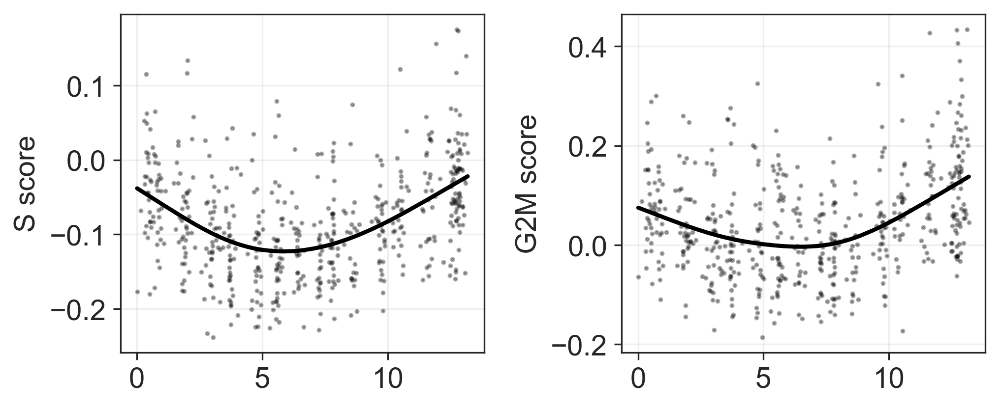

In [209]:
fig, axes = plt.subplots(ncols=2, figsize=(7, 3))

scf.pl.single_trend(
    clones_prolif,
    "S_score",
    basis="pca",
    color_exp="black",
    ylab="S score",
    ax_trend=axes[0],
    show=False,
    plot_emb=False,
)
axes[0].grid(alpha=0.3)
axes[0].set_xlabel("")

scf.pl.single_trend(
    clones_prolif,
    "G2M_score",
    basis="pca",
    color_exp="black",
    ylab="G2M score",
    ax_trend=axes[1],
    show=False,
    plot_emb=False,
)
axes[1].grid(alpha=0.3)
axes[1].set_xlabel("")

plt.tight_layout()

(0.2, 1.05)

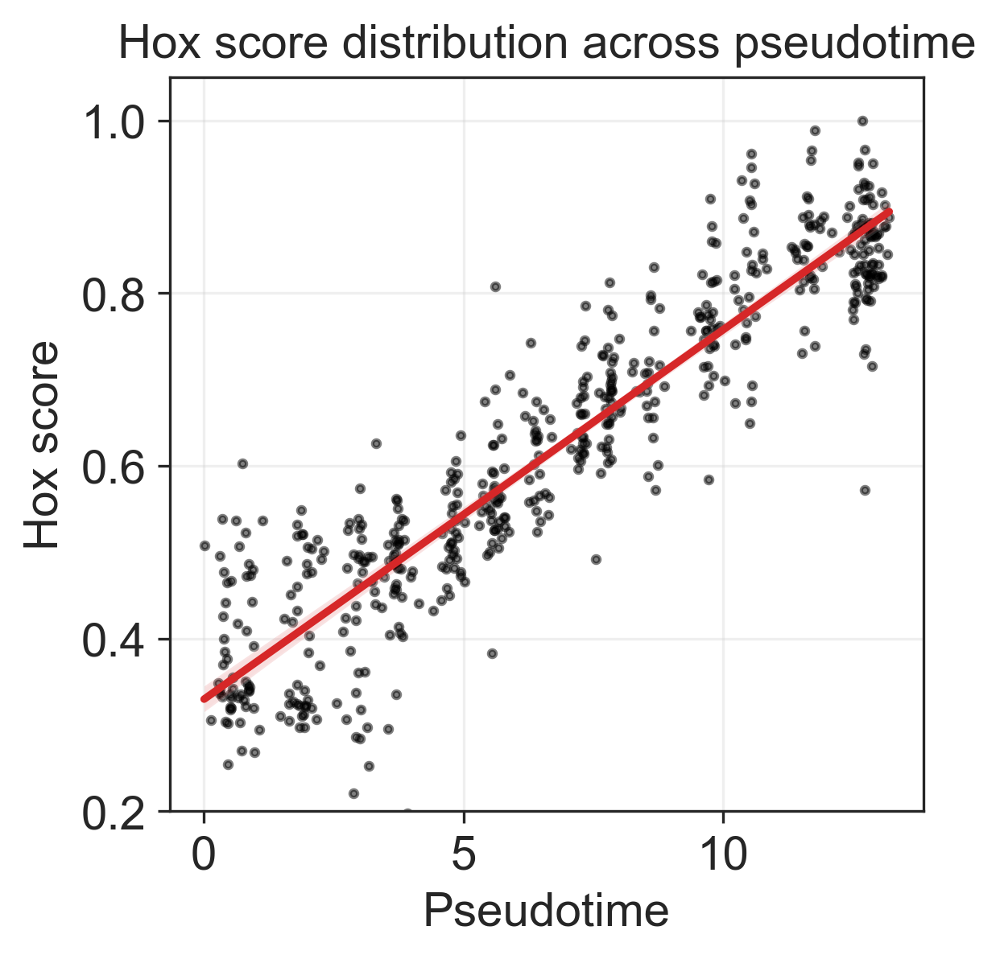

In [236]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.regplot(
    x=clones_expr.obs.t,
    y=clones_expr.obs.Hox_position,
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)
ax.set_xlabel("Pseudotime")
ax.set_ylabel("Hox score")
ax.set_title("Hox score distribution across pseudotime")
ax.grid(alpha=0.3)
ax.set_ylim(0.2, None)

In [34]:
from scipy.stats import pearsonr, spearmanr
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm

corr_pseudotime = {
    "pearson_corr": [],
    "pearson_p": [],
    "spearman_corr": [],
    "spearman_p": [],
}

t = clones_expr.obs.t
for gene in tqdm(clones_expr.var_names):
    expr = clones_expr[:, gene].X.A.T[0]
    
    if sum(expr) > 0:
        pearson_corr, pearson_p = pearsonr(t, expr)
        spearman_corr, spearman_p = spearmanr(t, expr)
        
        corr_pseudotime["pearson_corr"].append(pearson_corr)
        corr_pseudotime["pearson_p"].append(pearson_p)
        corr_pseudotime["spearman_corr"].append(spearman_corr)
        corr_pseudotime["spearman_p"].append(spearman_p)
        
corr_pseudotime = pd.DataFrame(corr_pseudotime, index=clones_expr.var_names[clones_expr.X.sum(axis=0).A[0] > 0])
corr_pseudotime["pearson_fdr"] = multipletests(corr_pseudotime.pearson_p.values, method="fdr_bh")[1]
corr_pseudotime["spearman_fdr"] = multipletests(corr_pseudotime.spearman_p.values, method="fdr_bh")[1]

100%|██████████| 27665/27665 [05:44<00:00, 80.25it/s]


In [50]:
corr_pseudotime.sort_values("pearson_p").head(10)

,pearson_corr,pearson_p,spearman_corr,spearman_p,pearson_fdr,spearman_fdr
Itm2a,-0.833437,3.859124e-139,-0.837722,6.958653e-142,1.037873e-134,1.871460e-137
Hoxa11os,0.801118,1.084441e-120,0.812390,1.022346e-126,1.458248e-116,1.374749e-122
Hoxc12,0.797960,4.511652e-119,0.750778,7.145767e-98,4.044545e-115,3.843565e-94
Hoxc13,0.769209,1.505706e-105,0.673569,7.362524e-72,1.012361e-101,9.428940e-69
Plagl1,-0.765058,9.288402e-104,-0.784900,1.134845e-112,4.996046e-100,1.017350e-108
Robo2,0.761249,3.786788e-102,0.775631,2.151337e-108,1.697365e-98,1.446452e-104
Cdkn1c,-0.737562,9.030357e-93,-0.738055,5.899879e-93,3.469463e-89,2.644522e-89
Hmga2,0.727069,6.180603e-89,0.720038,1.829097e-86,2.077764e-85,6.148966e-83
Postn,-0.712084,9.286343e-84,-0.730991,2.391199e-90,2.774966e-80,9.186987e-87
Col12a1,-0.697557,4.771739e-79,-0.709785,5.405458e-83,1.283312e-75,1.335641e-79


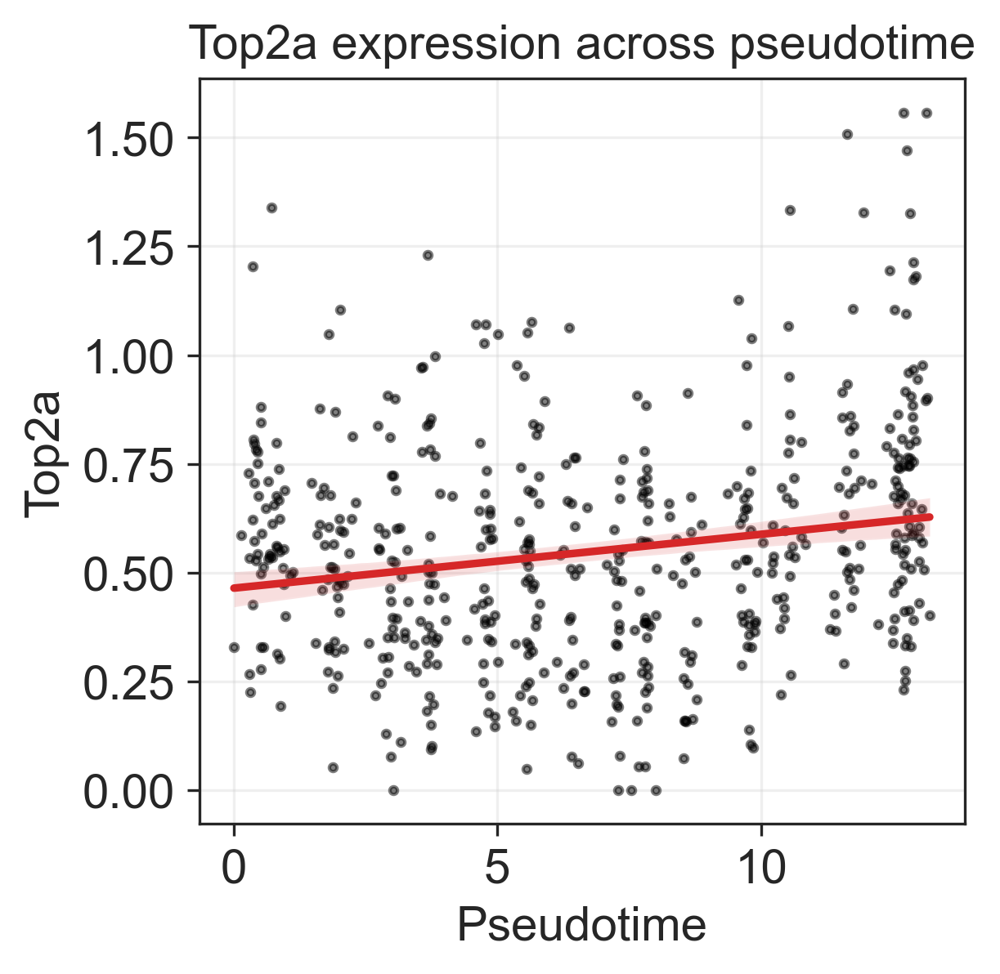

In [341]:
gene = "Top2a"

fig, ax = plt.subplots(figsize=(4, 4))

sns.regplot(
    x=clones_expr.obs.t,
    y=clones_expr[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)
ax.set_xlabel("Pseudotime")
ax.set_ylabel(gene)
ax.set_title(f"{gene} expression across pseudotime")
ax.grid(alpha=0.3)

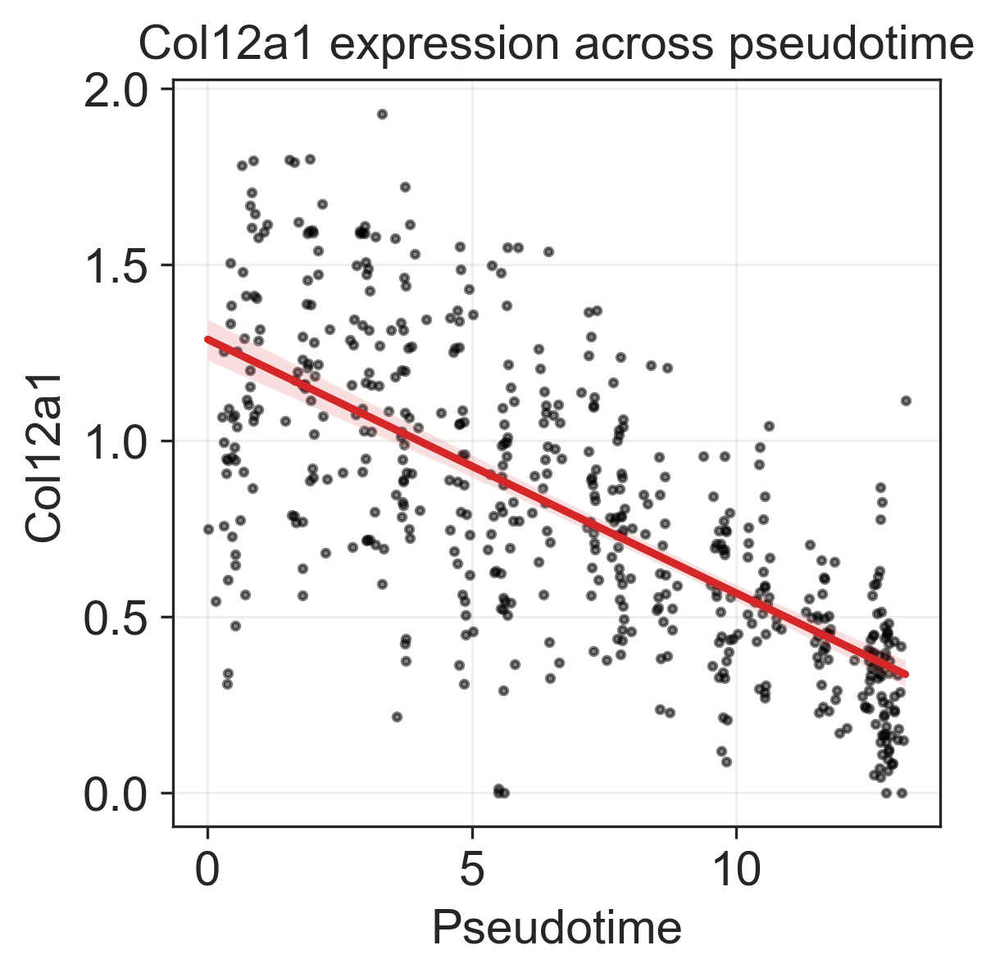

In [239]:
gene = "Col12a1"

fig, ax = plt.subplots(figsize=(4, 4))

sns.regplot(
    x=clones_expr.obs.t,
    y=clones_expr[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)
ax.set_xlabel("Pseudotime")
ax.set_ylabel(gene)
ax.set_title(f"{gene} expression across pseudotime")
ax.grid(alpha=0.3)

In [96]:
adata_subselection = adata[
    adata.obs.clone.isin(clones_expr.obs_names),
    corr_pseudotime.index,
]
adata_subselection = adata_subselection[
    ~adata_subselection.obs["celltype_l0"].isin(["Neurons", "Glia"])
]

adata_per_cluster = adata_subselection.to_df().groupby(
    adata_subselection.obs.celltype_l2
).mean()

In [100]:
def gini(array):
    array = np.sort(array)
    index = np.arange(1, array.shape[0] + 1)
    n = array.shape[0]

    return ((np.sum((2 * index - n  - 1) * array)) / (n * np.sum(array)))

In [108]:
corr_pseudotime["Gini_ct"] = [
    gini(adata_per_cluster[col]) for col in adata_per_cluster.columns
]

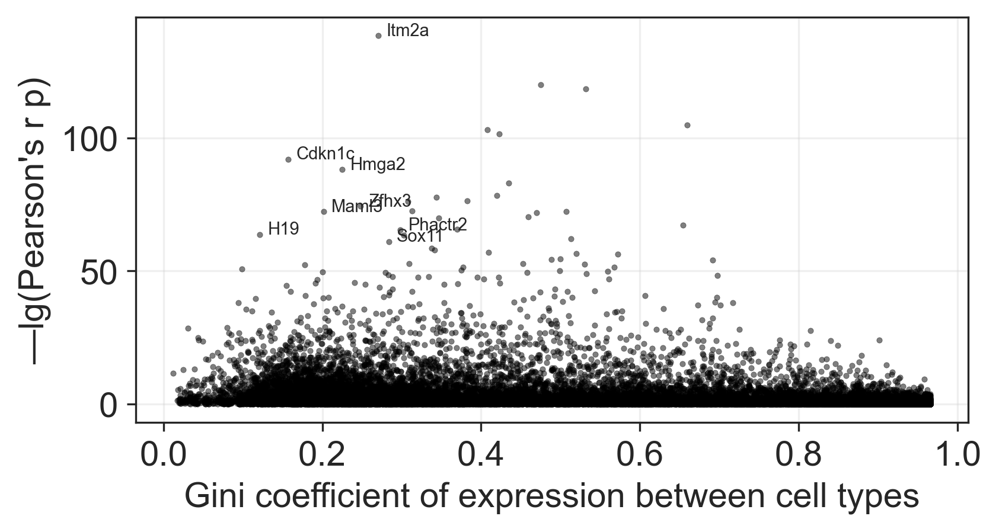

In [157]:
fig, ax = plt.subplots(figsize=(6, 3))

sns.scatterplot(
    x=corr_pseudotime.Gini_ct,
    y=-np.log10(corr_pseudotime.pearson_p),
    edgecolor=None,
    color="k",
    s=5,
    alpha=0.5,
    ax=ax,
)

corr_pseudotime_selected = corr_pseudotime[
    (corr_pseudotime.Gini_ct < 0.3) &
    (corr_pseudotime.pearson_p < 1e-60)
]
for gene, description in corr_pseudotime_selected.iterrows():
    ax.text(description.Gini_ct + 0.01, -np.log10(description.pearson_p), gene, size=7)

ax.set_xlabel("Gini coefficient of expression between cell types")
ax.set_ylabel("—lg(Pearson's r p)")
ax.grid(alpha=0.3)

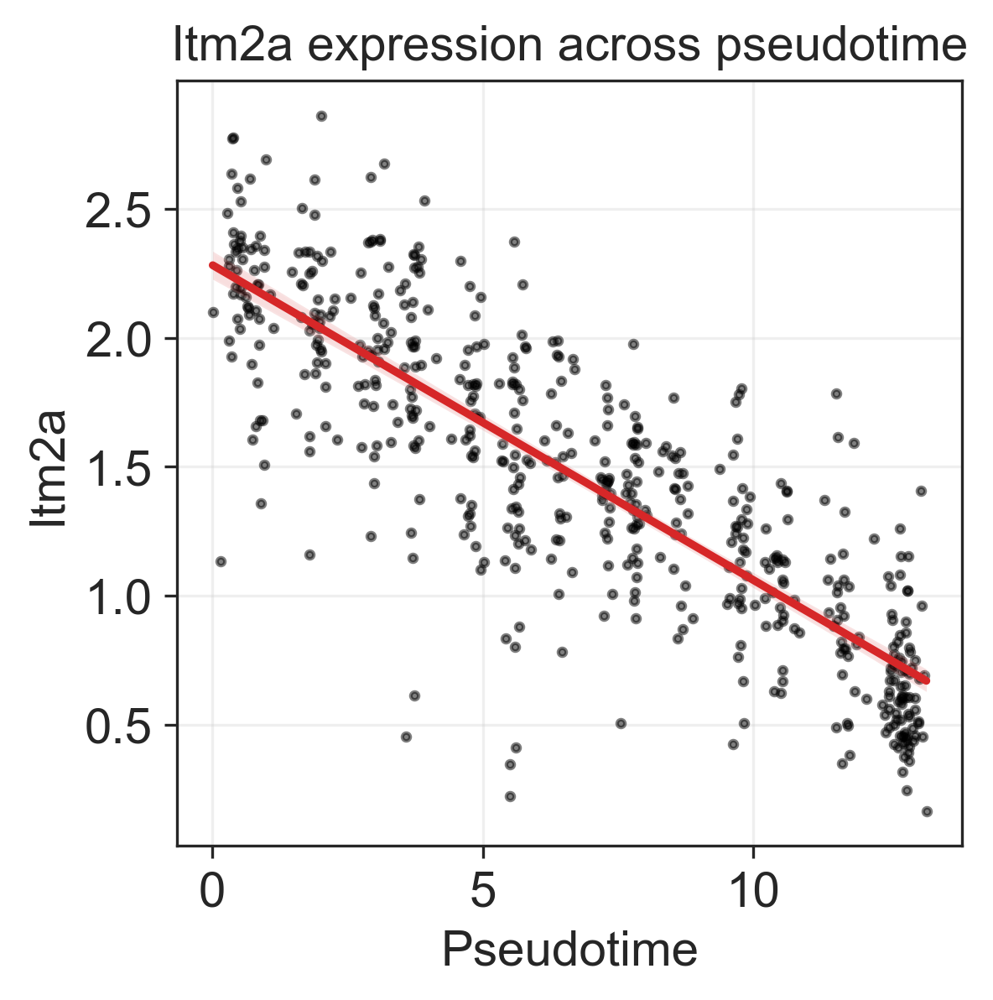

In [240]:
gene = "Itm2a"

fig, ax = plt.subplots(figsize=(4, 4))

sns.regplot(
    x=clones_expr.obs.t,
    y=clones_expr[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)
ax.set_xlabel("Pseudotime")
ax.set_ylabel(gene)
ax.set_title(f"{gene} expression across pseudotime")
ax.grid(alpha=0.3)

In [255]:
clones_all_expr = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding_expr.h5ad")

clones_all_expr.obs["Hox_position"] = (
    clones_all_expr[:, list(anterio_posterior_signature.keys())].X *
    np.array(list(anterio_posterior_signature.values())) / 
    clones_all_expr[:, list(anterio_posterior_signature.keys())].X.sum(axis=1).T.A
)[0]

clones_all_expr.obs["Hox_position"] = (
    clones_all_expr.obs["Hox_position"] - clones_all_expr.obs["Hox_position"].min()
) / (clones_all_expr.obs["Hox_position"].max() - clones_all_expr.obs["Hox_position"].min())

clones_all_expr.obs["Hox_position"] = [i if str(i) != "nan" else 0.5 for i in clones_all_expr.obs["Hox_position"]]

In [256]:
clones_somitic = clones_all_expr[
    clones_all_expr.obs.leiden_1.isin(["1", "2", "3", "4", "8"])
]
clones_nonsomitic = clones_all_expr[
    clones_all_expr.obs.leiden_1.isin(["7", "5", "6", "10"])
]

(0.0, 3.5)

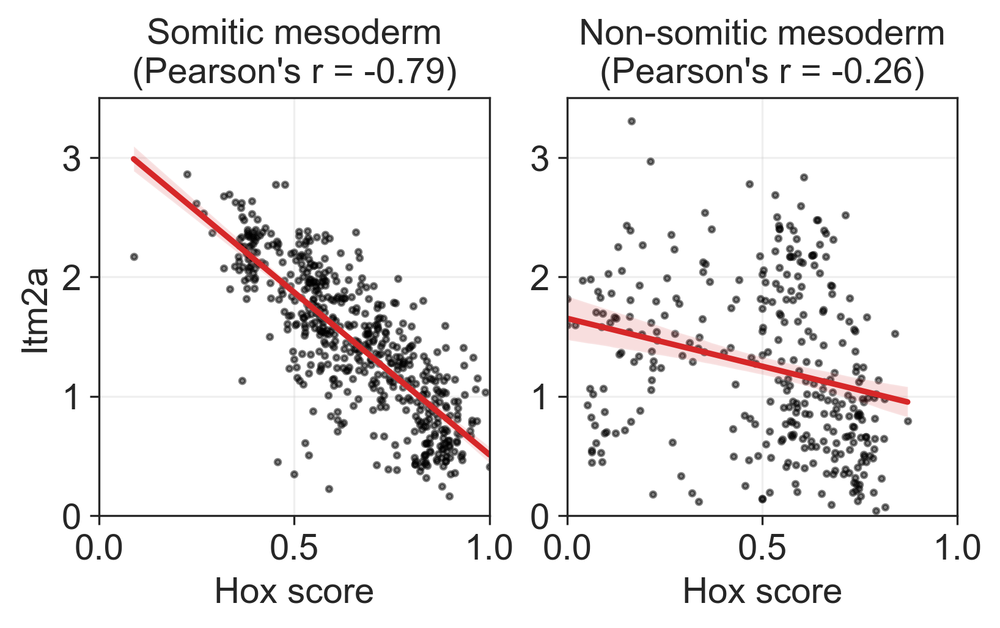

In [281]:
gene = "Itm2a"

fig, axes = plt.subplots(ncols=2, figsize=(6, 3))

ax = axes[0]
sns.regplot(
    x=clones_somitic.obs.Hox_position,
    y=clones_somitic[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)

r = np.round(pearsonr(
    clones_somitic.obs.Hox_position,
    clones_somitic[:, gene].X.A.T[0]
).statistic, 2)

ax.set_xlabel("Hox score")
ax.set_ylabel(gene)
ax.set_title(f"Somitic mesoderm\n(Pearson's r = {r})")
ax.grid(alpha=0.3)
ax.set_xlim(0, 1)
ax.set_ylim(0, 3.5)

ax = axes[1]
sns.regplot(
    x=clones_nonsomitic.obs.Hox_position,
    y=clones_nonsomitic[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)

r = np.round(pearsonr(
    clones_nonsomitic.obs.Hox_position,
    clones_nonsomitic[:, gene].X.A.T[0]
).statistic, 2)

ax.set_xlabel("Hox score")
ax.set_ylabel("")
ax.set_title(f"Non-somitic mesoderm\n(Pearson's r = {r})")
ax.grid(alpha=0.3)
ax.set_xlim(0, 1)
ax.set_ylim(0, 3.5)

(1.0, 5.0)

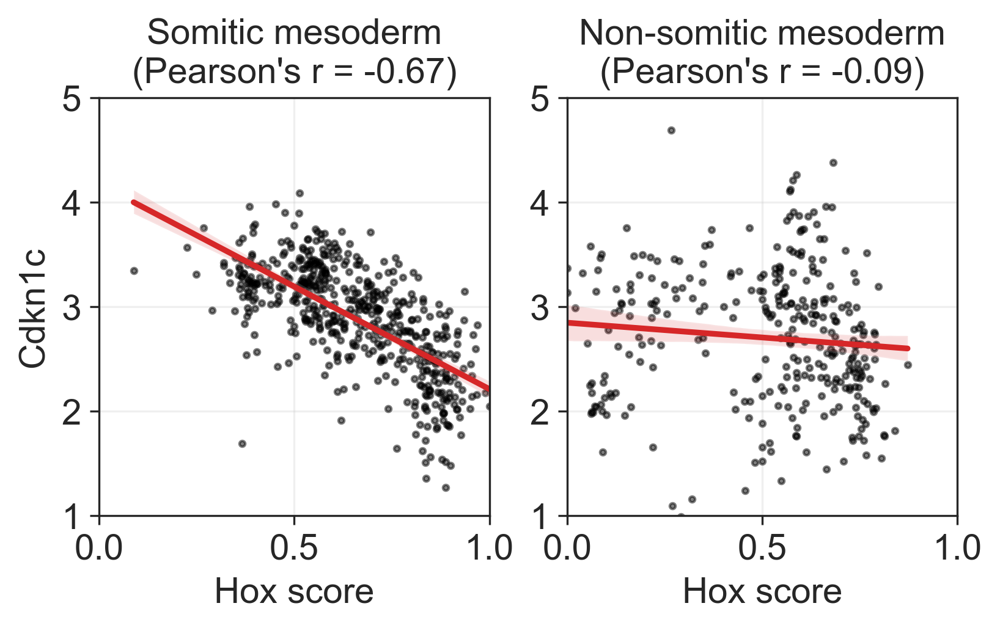

In [287]:
gene = "Cdkn1c"

fig, axes = plt.subplots(ncols=2, figsize=(6, 3))

ax = axes[0]
sns.regplot(
    x=clones_somitic.obs.Hox_position,
    y=clones_somitic[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)

r = np.round(pearsonr(
    clones_somitic.obs.Hox_position,
    clones_somitic[:, gene].X.A.T[0]
).statistic, 2)

ax.set_xlabel("Hox score")
ax.set_ylabel(gene)
ax.set_title(f"Somitic mesoderm\n(Pearson's r = {r})")
ax.grid(alpha=0.3)
ax.set_xlim(0, 1)
ax.set_ylim(1, 5)

ax = axes[1]
sns.regplot(
    x=clones_nonsomitic.obs.Hox_position,
    y=clones_nonsomitic[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)

r = np.round(pearsonr(
    clones_nonsomitic.obs.Hox_position,
    clones_nonsomitic[:, gene].X.A.T[0]
).statistic, 2)

ax.set_xlabel("Hox score")
ax.set_ylabel("")
ax.set_title(f"Non-somitic mesoderm\n(Pearson's r = {r})")
ax.grid(alpha=0.3)
ax.set_xlim(0, 1)
ax.set_ylim(1, 5)

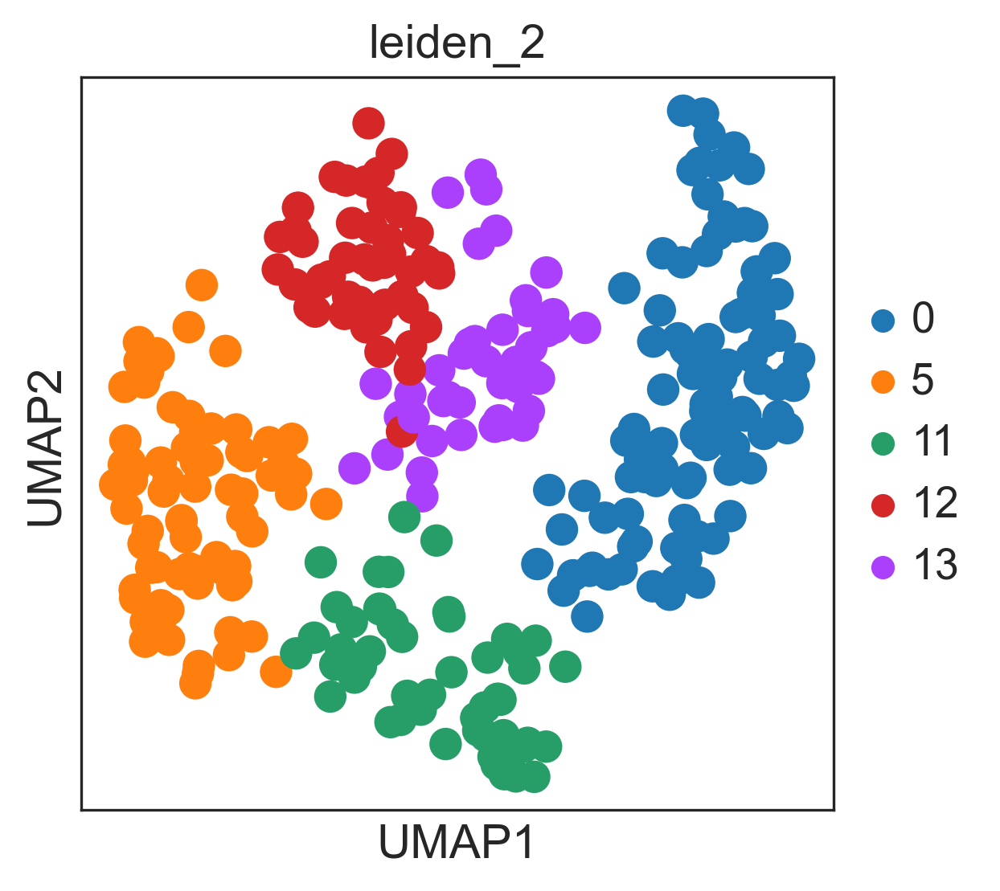

In [375]:
sc.pl.umap(clones_nonsomitic, color="leiden_2")

(0.25, 1.0)

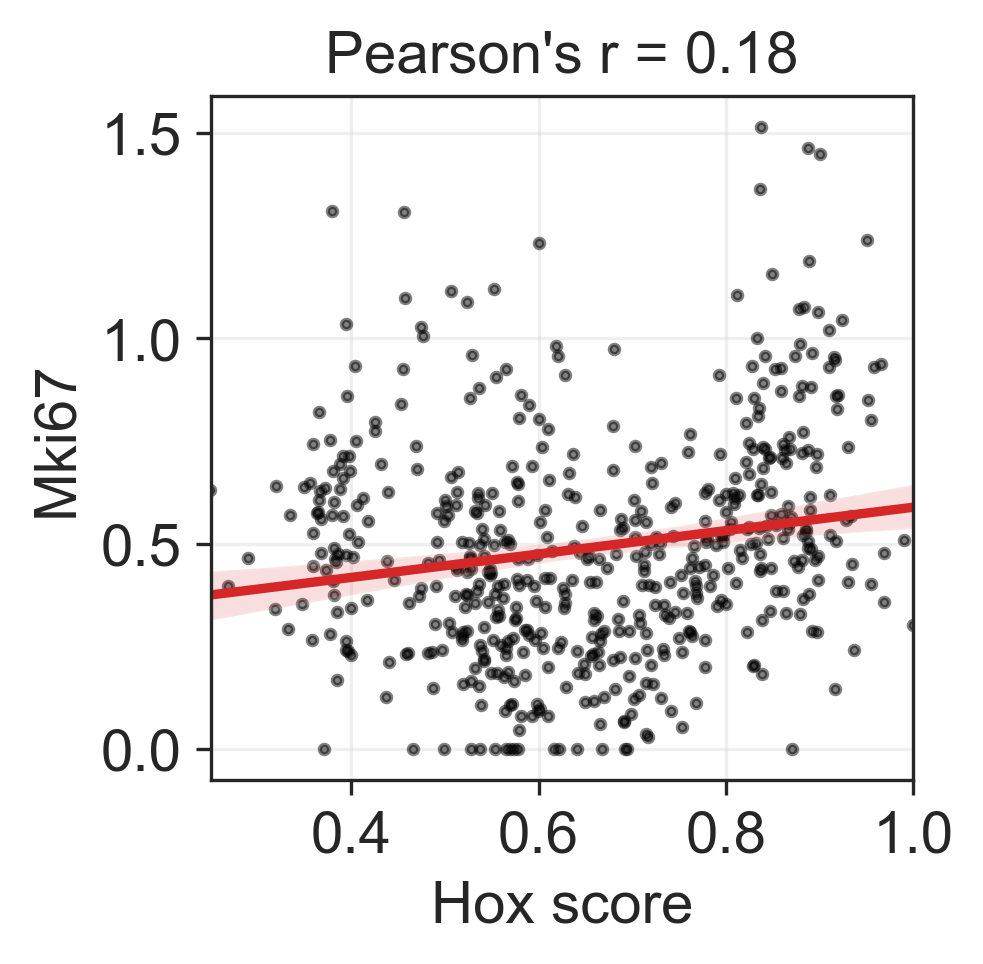

In [ ]:
gene = "Mki67"

fig, ax = plt.subplots(figsize=(3, 3))

sns.regplot(
    x=clones_somitic.obs.Hox_position,
    y=clones_somitic[:, gene].X.A.T[0],
    line_kws={
        "color": sns.color_palette()[3],
    },
    scatter_kws={
        "color": "black",
        "s": 5,
        "alpha": 0.5,
    },
    ax=ax,
)

r = np.round(pearsonr(
    clones_somitic.obs.Hox_position,
    clones_somitic[:, gene].X.A.T[0]
).statistic, 2)

ax.set_xlabel("Hox score")
ax.set_ylabel(gene)
ax.set_title(f"Pearson's r = {r}")
ax.grid(alpha=0.3)
ax.set_xlim(0.25, 1)

In [354]:
from scipy.stats import pearsonr, spearmanr
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm

corr_pseudotime_ct = {
    "pearson_corr": [],
    "pearson_p": [],
    "spearman_corr": [],
    "spearman_p": [],
}

t = clones.obs.t
for ct in tqdm(clones.var_names):
    composition = clones[:, ct].layers["frequencies"].T[0]
    
    if sum(expr) > 0:
        pearson_corr, pearson_p = pearsonr(t, composition)
        spearman_corr, spearman_p = spearmanr(t, composition)
        
        corr_pseudotime_ct["pearson_corr"].append(pearson_corr)
        corr_pseudotime_ct["pearson_p"].append(pearson_p)
        corr_pseudotime_ct["spearman_corr"].append(spearman_corr)
        corr_pseudotime_ct["spearman_p"].append(spearman_p)
        
corr_pseudotime_ct = pd.DataFrame(corr_pseudotime_ct, index=clones.var_names[clones.X.sum(axis=0) > 0])
corr_pseudotime_ct["pearson_fdr"] = multipletests(corr_pseudotime_ct.pearson_p.values, method="fdr_bh")[1]
corr_pseudotime_ct["spearman_fdr"] = multipletests(corr_pseudotime_ct.spearman_p.values, method="fdr_bh")[1]

100%|██████████| 46/46 [00:00<00:00, 204.56it/s]


In [365]:
clones.X = clones.layers["frequencies"].copy()
selected_cts = corr_pseudotime_ct.sort_values("pearson_p").head(10).index
clones_fit = scf.tl.fit(clones, features=selected_cts, n_jobs=20, copy=True)

fit features associated with the trajectory
    single mapping :   0%|          | 0/10 [00:00<?, ?it/s]

Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.g

    single mapping :  10%|█         | 1/10 [00:16<02:29, 16.64s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  20%|██        | 2/10 [00:16<01:07,  8.44s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  60%|██████    | 6/10 [00:17<00:11,  2.86s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping :  90%|█████████ | 9/10 [00:17<00:01,  1.95s/it]

/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


    single mapping : 100%|██████████| 10/10 [00:18<00:00,  1.81s/it]
    finished (adata subsetted to keep only fitted features!) (0:00:18) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


/home/sergey/miniconda3/envs/sc/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:54: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


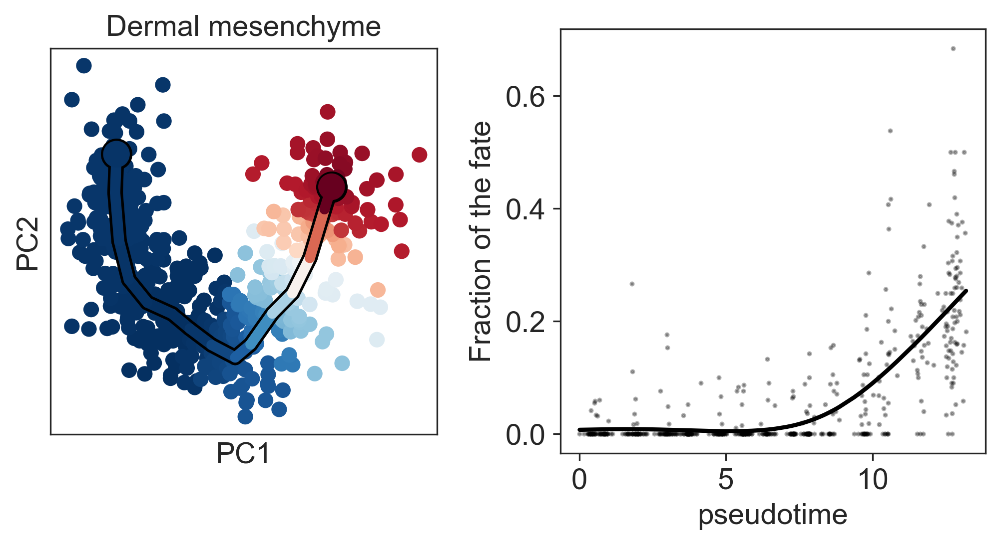

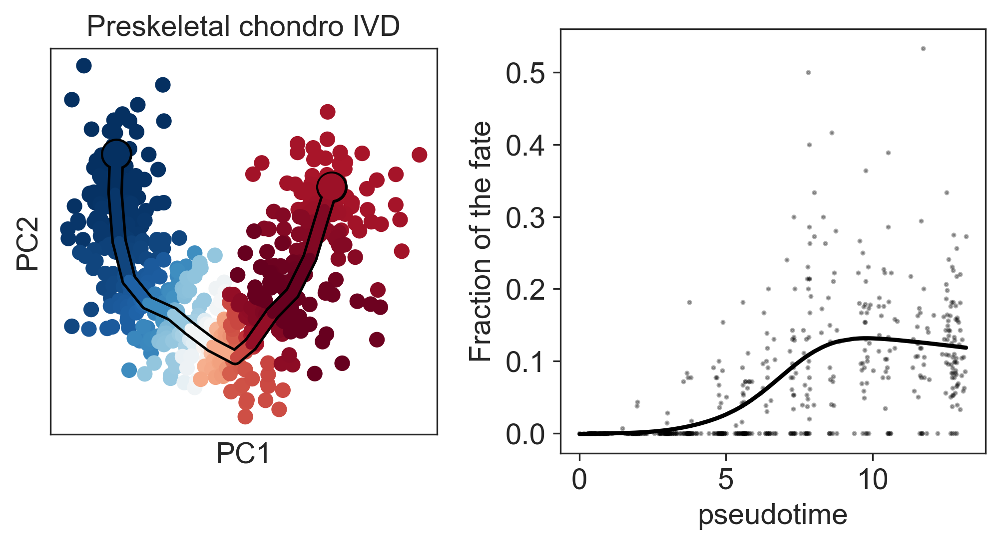

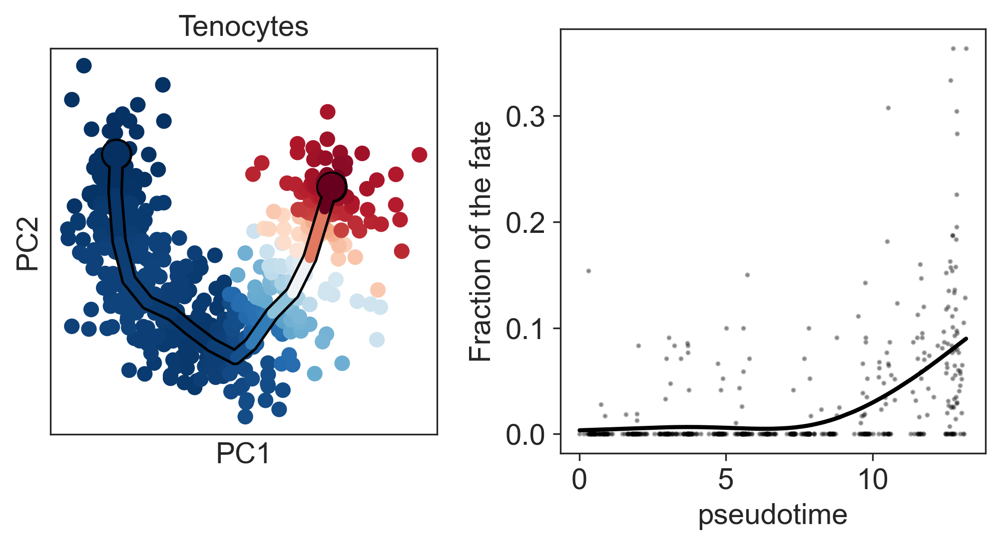

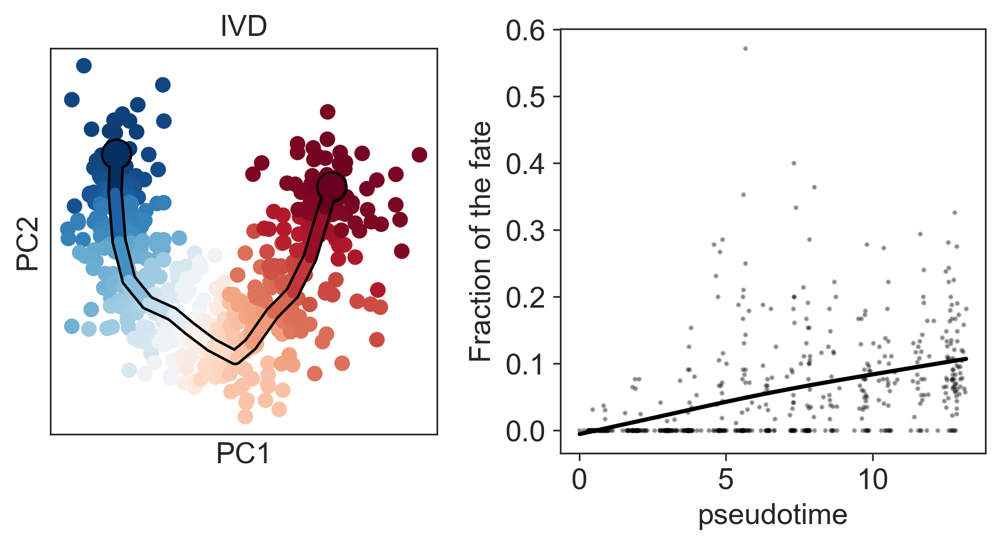

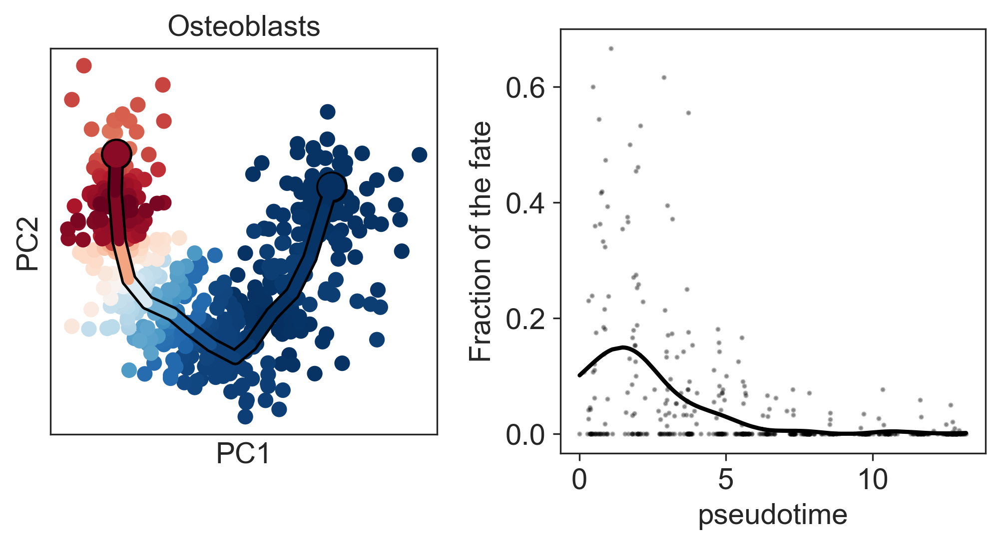

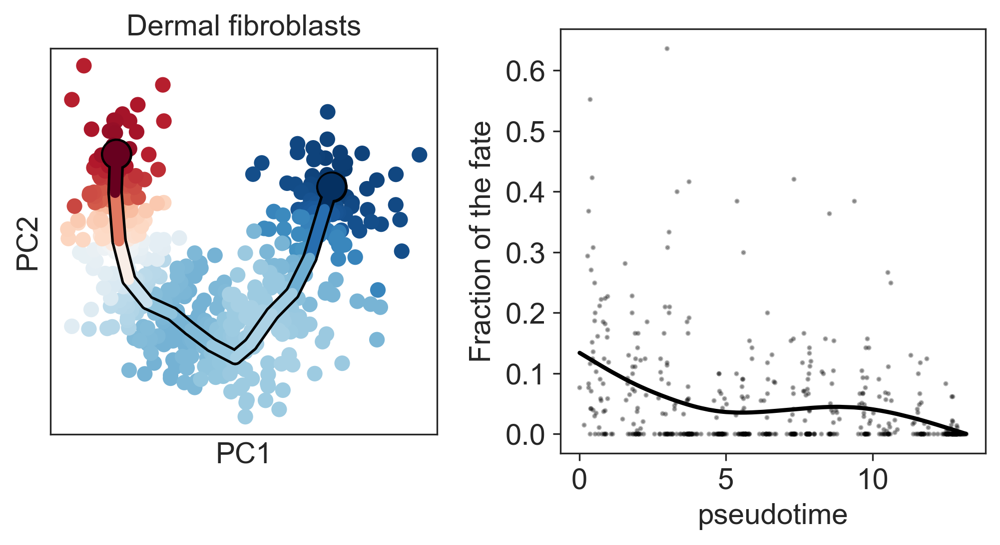

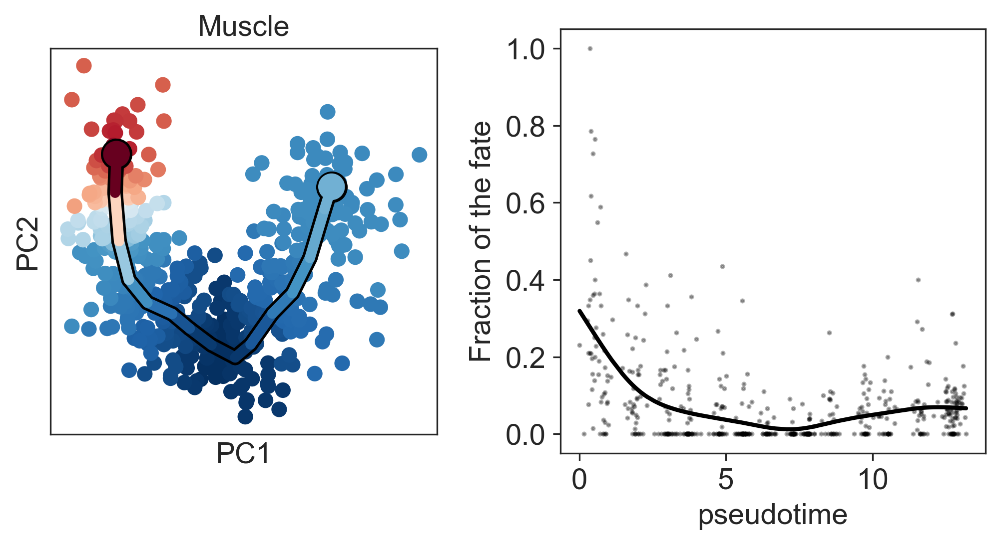

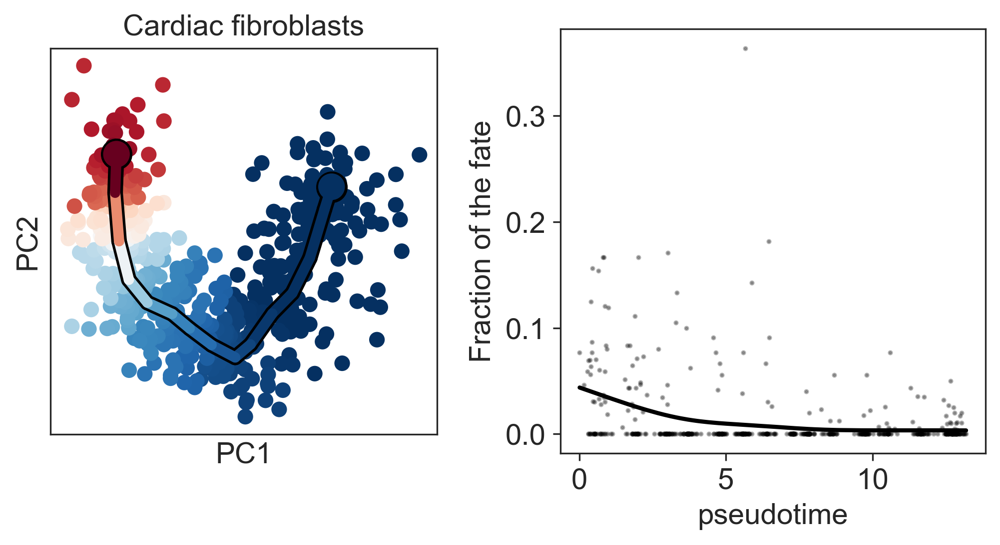

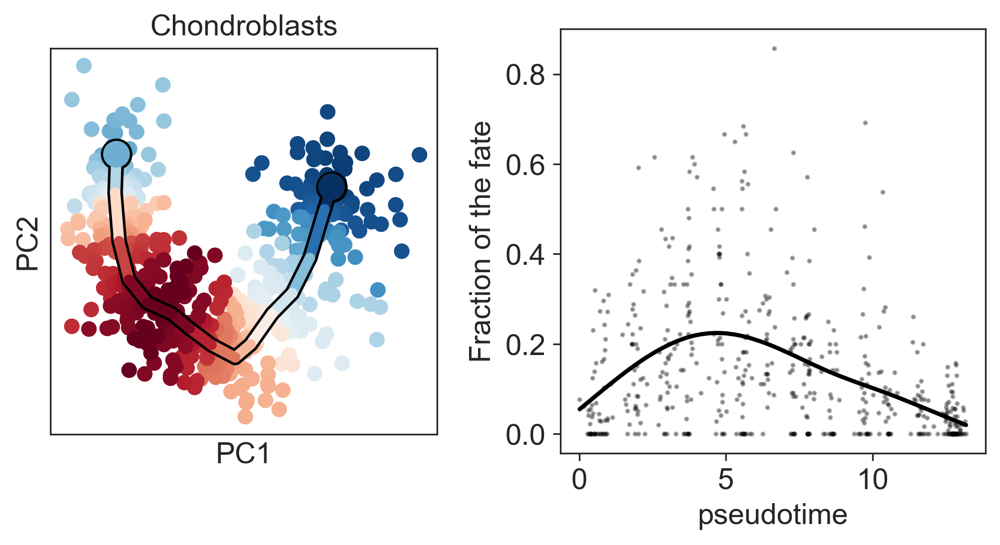

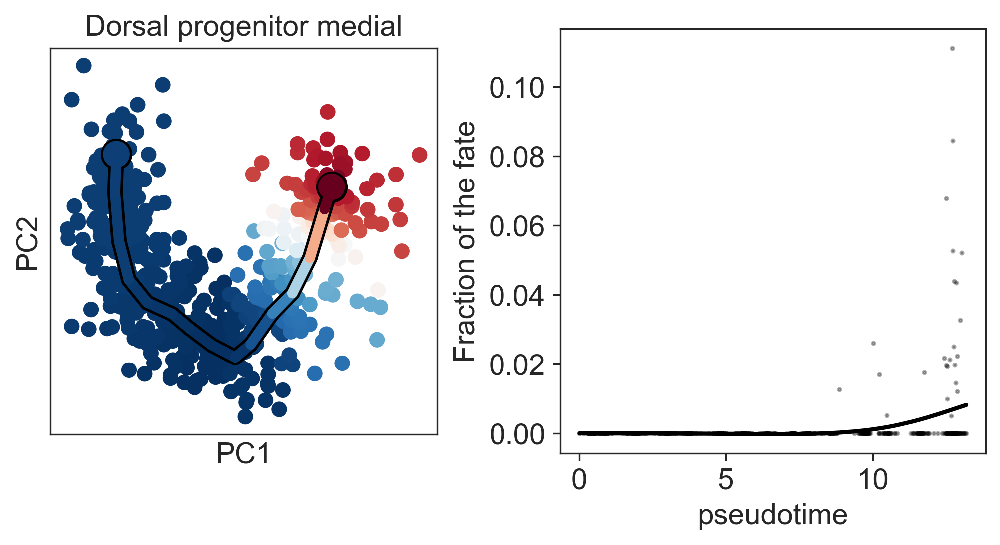

In [367]:
for ct in selected_cts:
    scf.pl.single_trend(clones_fit, ct, basis="pca", color_exp="black",
                        ylab="Fraction of the fate", save=f"contin_{ct}_prop.pdf")

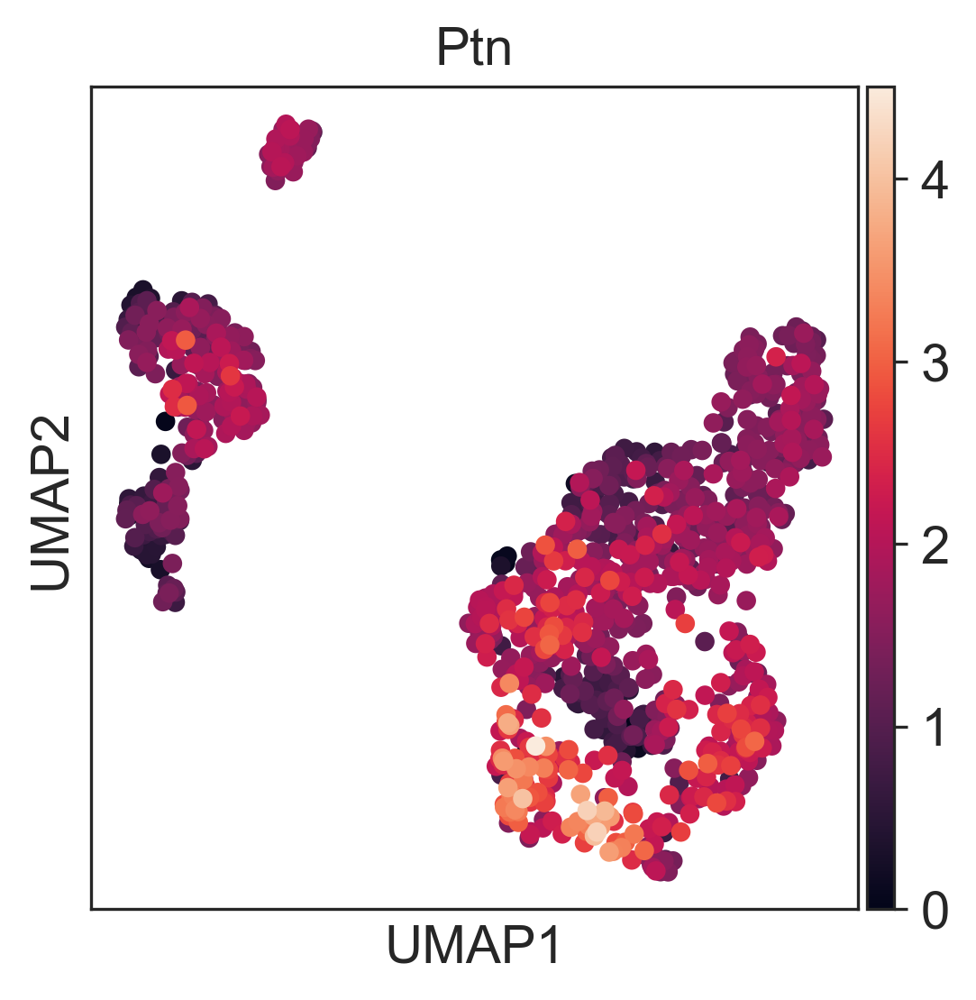

In [373]:
sc.pl.umap(clones_all, color="Ptn")

## Example of discrete clusters

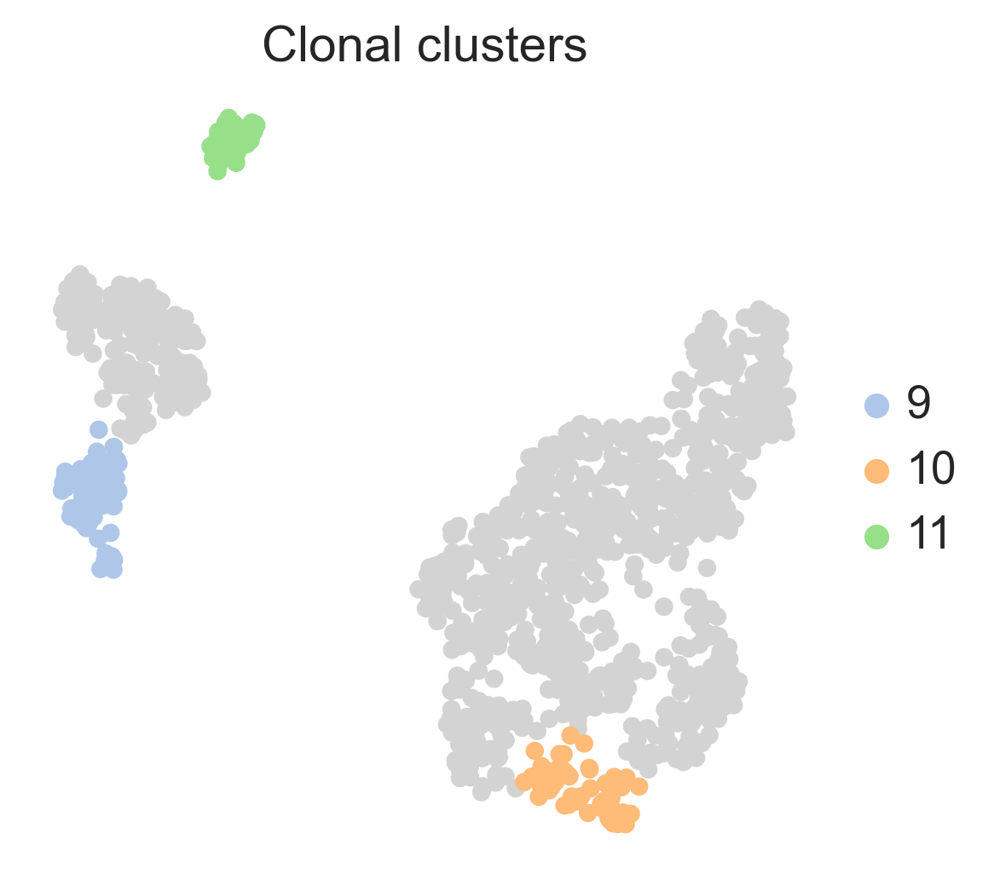

In [543]:
clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_trunk_E13/E13_clonal_embedding.h5ad")

selected_clusters = ["9", "10", "11"]

sc.pl.umap(clones, color="leiden_1", title="Clonal clusters", groups=selected_clusters, frameon=False,
           na_in_legend=False, save="discrete_clonal_clusters.pdf")

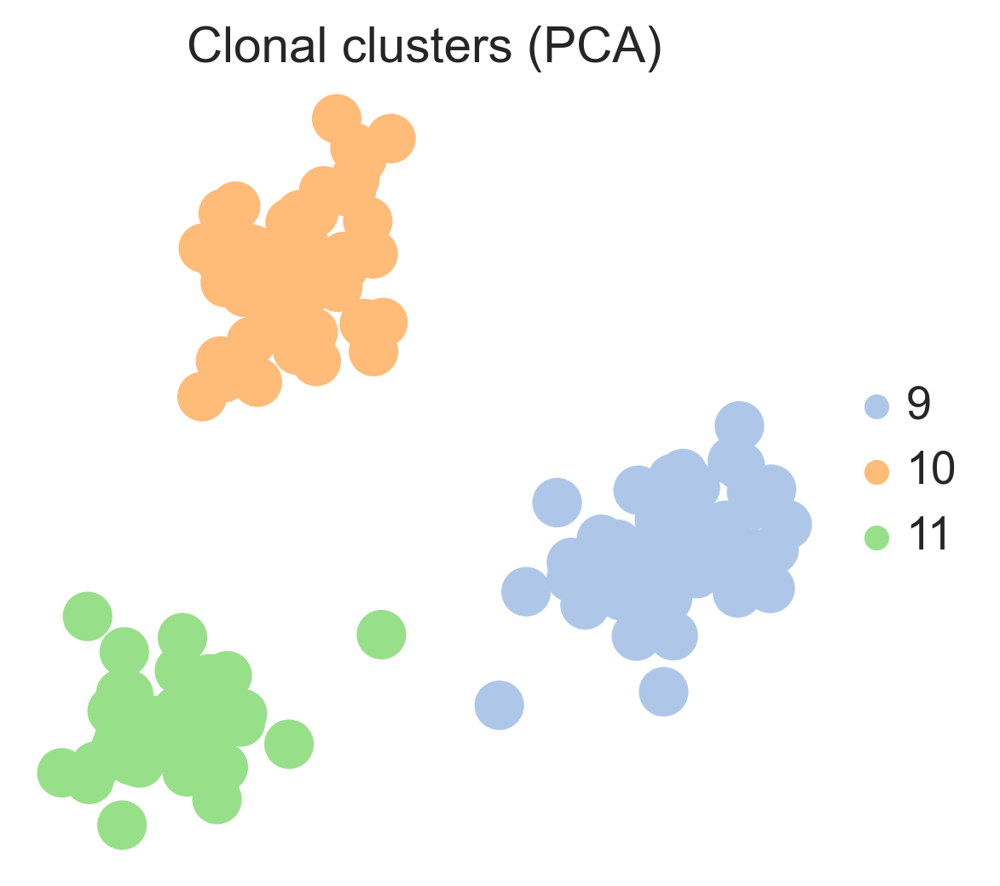

In [544]:
clones = clones[clones.obs.leiden_1.isin(selected_clusters)].copy()

clones.obsm["X_pca"] = sc.pp.pca(clones.obsm["word2vec"], n_comps=3)
sc.pl.pca(clones, color="leiden_1", title="Clonal clusters (PCA)", frameon=False,
          save="discrete_clonal_clusters.pdf")

inferring a principal curve --> parameters used 
    10 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:00) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.


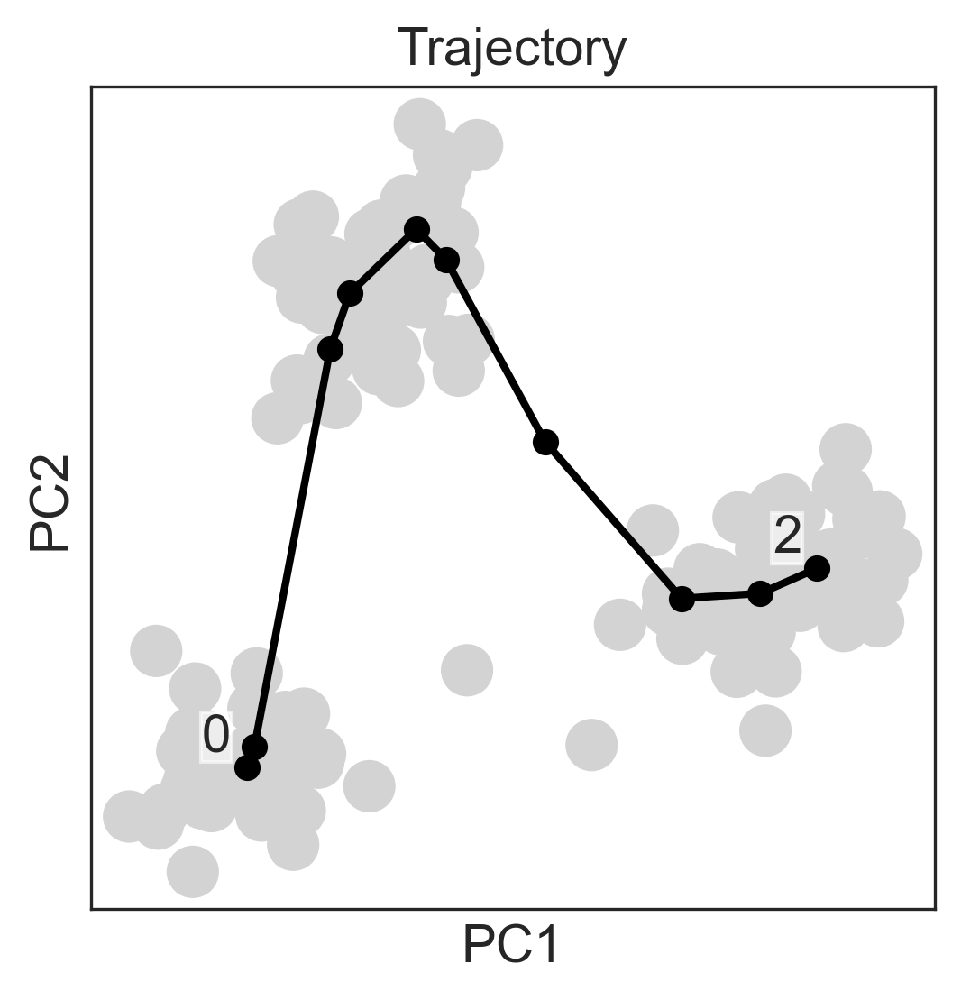

In [545]:
scf.tl.curve(clones, Nodes=10, use_rep="X_pca", ndims_rep=2)
scf.pl.graph(clones, basis="pca", title="Trajectory", save="discrete_trajectory.pdf")

In [546]:
scf.tl.root(clones, 0)
scf.tl.pseudotime(clones, n_jobs=20, n_map=100, seed=42)

node 0 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    mappings:   0%|          | 0/100 [00:00<?, ?it/s]

Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 2.
Unable to determine R library path: Command '('/home/sergey/miniconda3/envs/sc/lib/R/bin/Rscript', '-e', 'cat(Sys.g

    mappings: 100%|██████████| 100/100 [00:26<00:00,  3.83it/s]
    finished (0:00:26) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


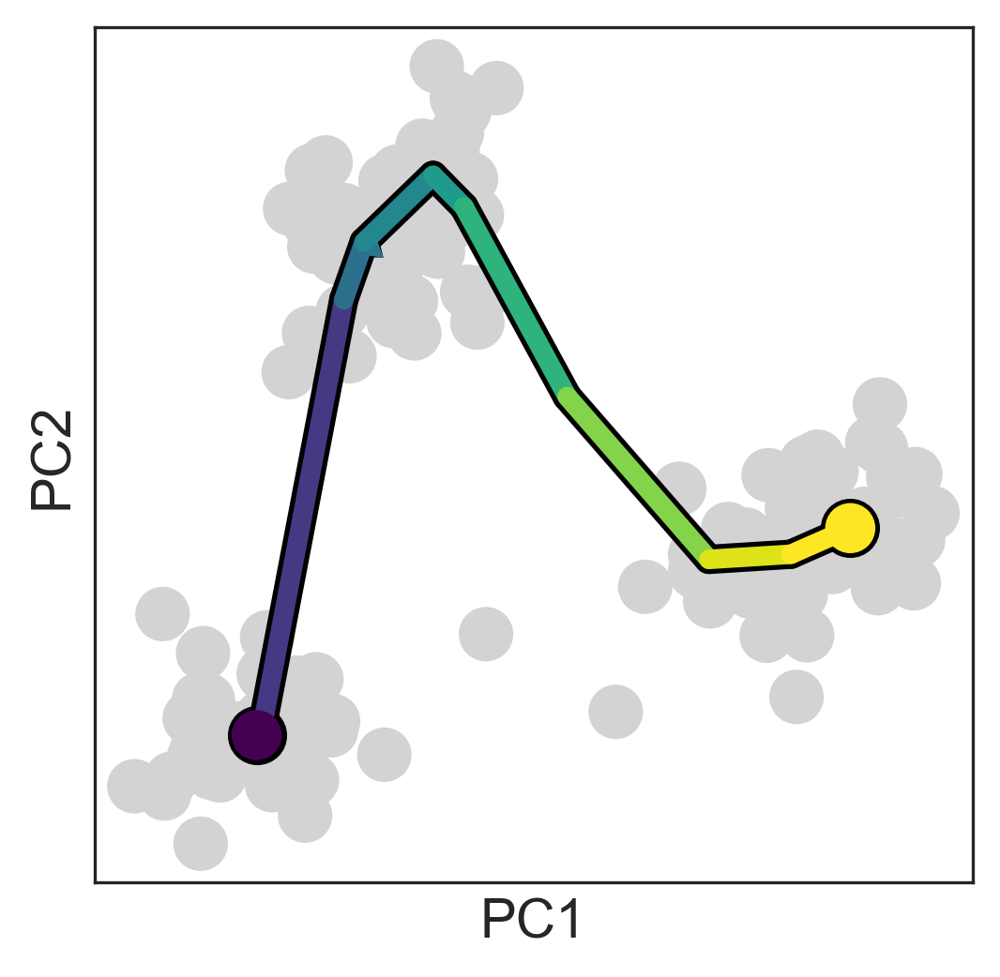

In [547]:
scf.pl.trajectory(clones, basis="pca", arrows=True, arrow_offset=3,
                  save="discrete_pseudotime.pdf")

In [548]:
sc.tl.rank_genes_groups(clones, groupby="leiden_1", method="wilcoxon")

selected_cts = []
for cluster in selected_clusters:
    selected_cts += list(sc.get.rank_genes_groups_df(clones, group=cluster).names[:5])
selected_cts = list(set(selected_cts))

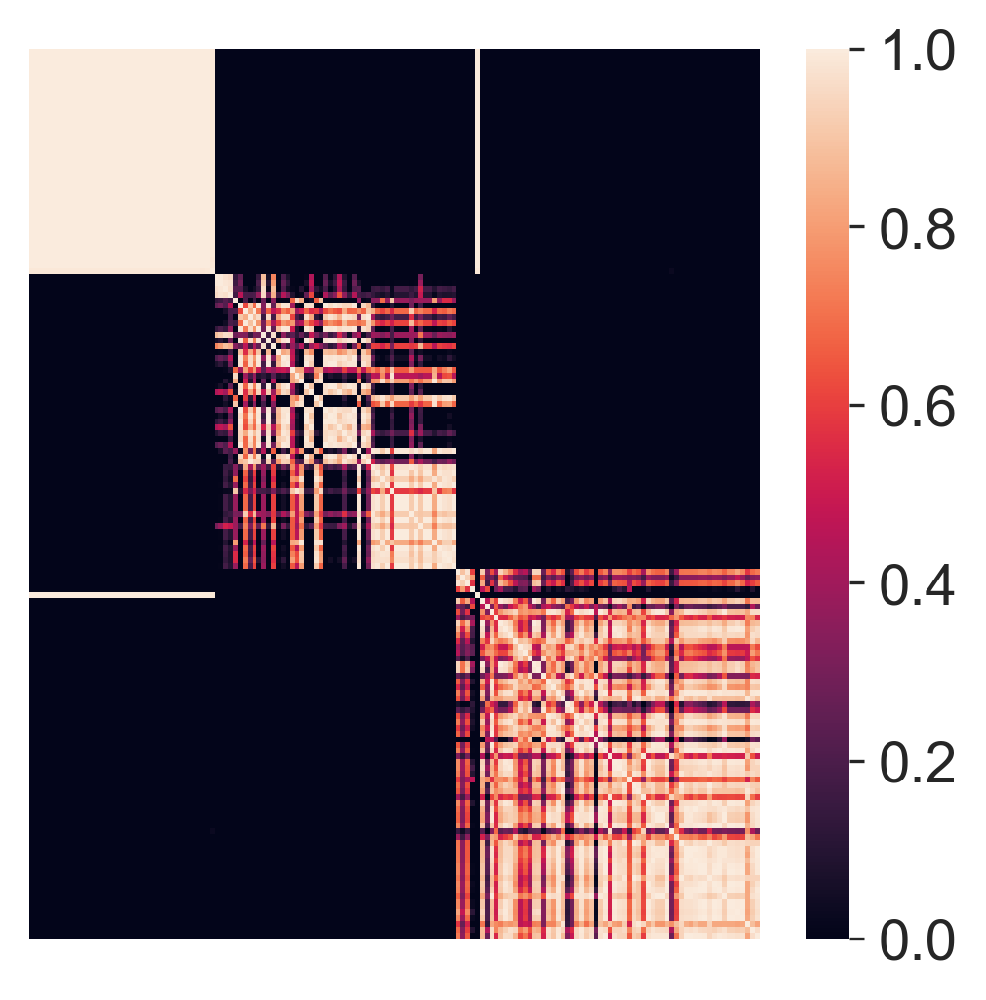

In [549]:
fig, ax = plt.subplots(figsize=(4, 4))

sns.heatmap(
    pd.DataFrame(clones[clones.obs.t.sort_values().index, selected_cts].layers["frequencies"]).T.corr(),
    vmin=0,
    ax=ax,
)
ax.set_xticks([])
ax.set_yticks([])

plt.savefig("contin/discrete_correlations.png", bbox_inches="tight")

In [513]:
del clones.uns["epg"]

clones.write_h5ad("contin/discrete_clones.h5ad")